## Task 2. Julia set
$z_{n+1}\leftarrow z_n^2+c$\
$c \leftarrow \text{const}\in \mathbb{C}$

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm

In [2]:
def julia(c):
  # Image width and height; parameters for the plot
  im_width, im_height = 750, 500
  zabs_max = 10
  nit_max = 500
  xmin, xmax = -1.5, 1.5
  xwidth = xmax - xmin
  ymin, ymax = -1, 1
  yheight = ymax - ymin
  julia = np.zeros(( im_height, im_width))
  for x in range(im_width):
      for iy in range(im_height):
          nit = 0
          # Map pixel position to a point in the complex plane
          z = complex(x / im_width * xwidth + xmin,
                      iy / im_height * yheight + ymin)
          # Do the iterations
          while abs(z) <= zabs_max and nit < nit_max:
              z = z**2 + c
              nit += 1
          ratio = nit / nit_max
          julia[iy,x] = ratio
  return julia


Text(0, 0.5, 'Im $z$')

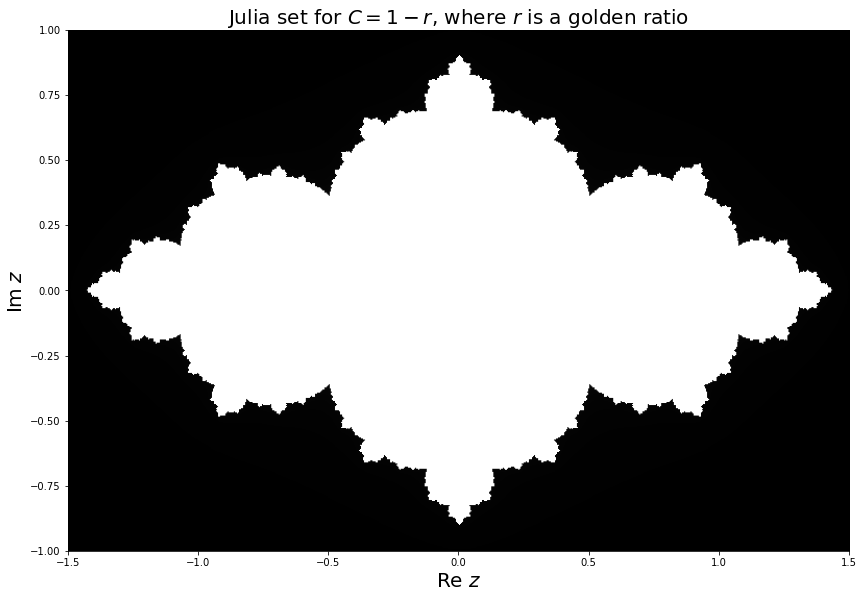

In [3]:
fig, ax = plt.subplots(figsize=(14,11))
ax.imshow(julia(c=1-(1+5**0.5)/2), origin='lower',extent=[-1.5,1.5,-1,1],cmap='gray')
ax.set_title("Julia set for $C = 1-r$, where $r$ is a golden ratio", fontsize = 20)
ax.set_xlabel("Re $z$", fontsize = 20)
ax.set_ylabel("Im $z$", fontsize = 20)


### 4. Plot figures for c=exp(ia), a = range(0,2pi) & write down axes like in subtask 3, create animation of these figures slowly changing the a

In [ ]:
from matplotlib import rc
rc('animation', html='jshtml')
from matplotlib.animation import FuncAnimation, ArtistAnimation

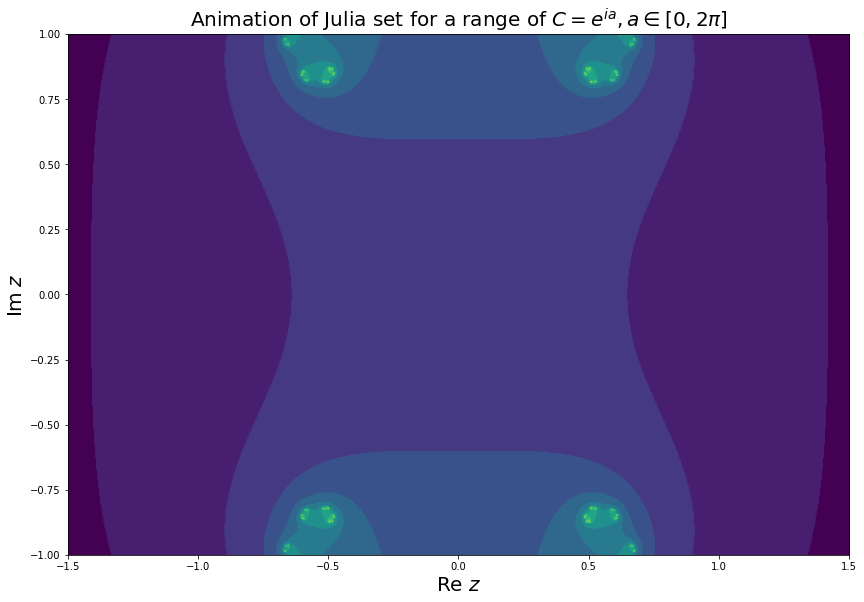

In [ ]:
fig, ax = plt.subplots(figsize=(14,11))

ims = []
for a in np.linspace(0,2*np.pi,100):
  im = ax.imshow(julia(c = np.exp(complex(0,1) * a) ), animated = True, extent = [-1.5,1.5,-1,1])
  ax.set_title("Animation of Julia set for a range of $C = e^{i a}, a \in [0,2 \pi]$", fontsize = 20)
  ax.set_xlabel("Re $z$", fontsize = 20)
  ax.set_ylabel("Im $z$", fontsize = 20)
  if a == 0:
    im = ax.imshow(julia(c = np.exp(complex(0,1) * a) ), extent = [-1.5,1.5,-1,1])
    ax.set_title("Animation of Julia set for a range of $C = e^{i a}, a \in [0,2 \pi]$", fontsize = 20)
    ax.set_xlabel("Re $z$", fontsize = 20)
    ax.set_ylabel("Im $z$", fontsize = 20)

  ims.append( [im] )

ani = ArtistAnimation(fig, ims, interval = 50, blit=True, repeat_delay=1000)


In [ ]:
ani